# Solar Panels segmentation U-Net


### This notebook proposes into the use of the U-Net model, a deep learning architecture, for the detection of Solar Photovoltaic 

What is solar photovoltaic
A photovoltaic (PV) panel, commonly called a solar panel, contains PV cells that absorb the sun’s light and convert solar energy into electricity. Solar panels that produce electricity are known as solar photovoltaic (PV) modules. These panels generate electricity when exposed to light. Solar PV is the rooftop solar you see on homes and businesses.

Solar photovoltaic (PV) installations are pivotal in harnessing renewable energy and contributing to sustainable development. Detecting and mapping these installations accurately is essential for effective energy management, policy-making, and urban planning. 

Traditionally, the identification of solar PV installations involves manual surveys, which are labor-intensive and costly.

With advancements in remote sensing and deep learning, automated methods using satellite and aerial imagery have emerged as efficient alternatives. 

### Deep Learning and U-Net Model

Deep learning has revolutionized various domains of computer vision, including image segmentation, classification, and object detection. Convolutional Neural Networks (CNNs) are a class of deep learning models specifically designed for processing structured grid data such as images. They are adept at learning hierarchical representations directly from pixel values, making them ideal for tasks like image segmentation.

The U-Net model, originally developed for biomedical image segmentation, has proven to be highly effective for pixel-wise prediction tasks.             Its architecture is symmetrical, consisting of an encoder (downsampling path) and a decoder (upsampling path), interconnected by skip connections. These skip connections ensure that spatial information lost during downsampling is recovered during upsampling, enabling the model to produce precise segmentations.


### Learning to detect solar photovoltaic (PV) installations using a U-Net model can be beneficial for several groups:

- Renewable Energy Analysts: Experts and analysts in the renewable energy sector who need to automate the detection and monitoring of solar PV installations for resource assessment, efficiency analysis, and market analysis.
- Environmental Scientists: Researchers and practitioners in environmental science and sustainability who are interested in assessing the impact of solar PV installations on land use and environmental change.
- Utility Companies: Professionals working for utility companies who need to monitor and manage the integration of distributed solar PV systems into the grid.
- Academics and Students: Students and researchers in fields like computer science, electrical engineering, environmental science, and renewable energy who are working on projects related to solar energy and machine learning.
- 
Government Agencies: Employees in governmental organizations responsible for energy planning, environmental monitoring, and policy implementation who need accurate data on solar PV deploymen
- 

Non-Governmental Organizations (NGOs): NGOs focused on renewable energy, environmental conservation, and sustainable development who need to track the growth and impact of solar PV installations.

# I. Import libraries
___

In [1]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [59]:
#import library
import numpy as np 
import pandas as pd 
import shutil
import tensorflow as tf
from zipfile import ZipFile 
import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
from PIL import Image

# II. Utility Functions
---

In [60]:
def prepare_dataframe(image_path, name):
    solar_ids = []
    paths = []
    for dirname, _, filenames in os.walk(image_path):
        for filename in filenames:
            path = os.path.join(dirname, filename)    
            paths.append(path)

            solar_id = filename.split(".")[0]
            solar_ids.append(solar_id)

    d = {"id": solar_ids, name: paths}
    df = pd.DataFrame(data = d)
    df = df.set_index('id')
    return df

In [61]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

# III. Dataset Preparation
___

In [7]:
!mkdir train
!mkdir train_masks

mkdir: cannot create directory ‘train’: File exists
mkdir: cannot create directory ‘train_masks’: File exists


In [8]:
#copy all images to image folder and save labels to label folder with same name as correspoding image

root_dir = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03'
resolution = 'PV03'
data_dir = os.path.join(root_dir)#,resolution)

image_root = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train'
label_root = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train_masks'
if not os.path.isdir(image_root):
    os.mkdir(image_root)
if not os.path.isdir(label_root):
    os.mkdir(label_root)

images = list()
labels = list()

for (dirpath, dirnames, filenames) in os.walk(data_dir):
    # img_names += [os.path.join(dirpath, file) for file in filenames]
    images += [os.path.join(dirpath, file) for file in filenames]

labels += [i for i in filter(lambda score: '_label.bmp' in score, images)]
images = [i for i in filter(lambda score: '_label.bmp' not in score, images)]

for img_path in images:
    src_path = img_path
    dst_path = os.path.join(image_root,os.path.basename(img_path))
    img = Image.open(src_path)
    new_img = img.resize( (256, 256) )
    new_img.save( dst_path[:-4]+'.png', 'png')

for label_path in labels:
    src_path = label_path
    file_name = os.path.basename(label_path).replace('_label','')
    dst_path = os.path.join(label_root,file_name)
    img = Image.open(src_path)
    new_img = img.resize( (256, 256) )
    new_img.save( dst_path[:-4]+'.png', 'png')

In [62]:
print("Train set:  ", len(os.listdir("/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train")))
print("Train masks:", len(os.listdir("/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train_masks")))

Train set:   2308
Train masks: 2308


In [63]:
df = prepare_dataframe('/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train', "solar_path")
mask_df = prepare_dataframe('/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar_test/PV03/train_masks', "mask_path")
df["mask_path"] = mask_df["mask_path"]

# IV. Data Pre-processing and Augmentation
___

In [64]:
img_size = [256,256]

def data_augmentation(solar_img, mask_img):

    if tf.random.uniform(()) > 0.5:
        solar_img = tf.image.flip_left_right(solar_img)
        mask_img = tf.image.flip_left_right(mask_img)

    return solar_img, mask_img

def preprocessing(solar_path, mask_path):
    solar_img = tf.io.read_file(solar_path) 
    solar_img = tf.image.decode_jpeg(solar_img, channels=3)
    solar_img = tf.image.resize(solar_img, img_size)
    solar_img = tf.cast(solar_img, tf.float32) / 255.0
    
    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_jpeg(mask_img, channels=3)
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = mask_img[:,:,:1]    
    mask_img = tf.math.sign(mask_img)
    
    
    return solar_img, mask_img

def create_dataset(df, train = False):
    if not train:
        ds = tf.data.Dataset.from_tensor_slices((df["solar_path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((df["solar_path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
        ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds

In [65]:
# Now we will split the dataset into train and test
train_df, valid_df = train_test_split(df, random_state=42, test_size=.25)
train = create_dataset(train_df, train = True)
valid = create_dataset(valid_df)

In [66]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [67]:
TRAIN_LENGTH = len(train_df)
BATCH_SIZE = 24
BUFFER_SIZE = 1000

In [68]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)

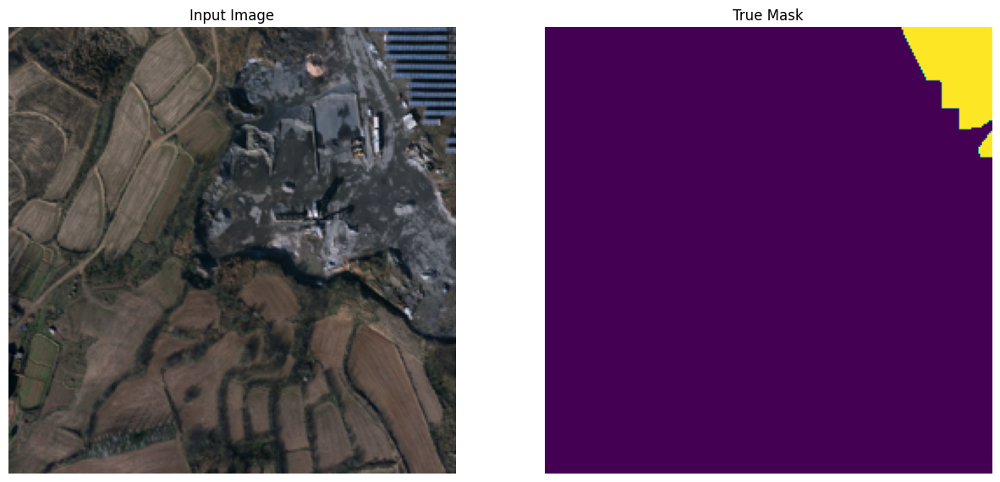

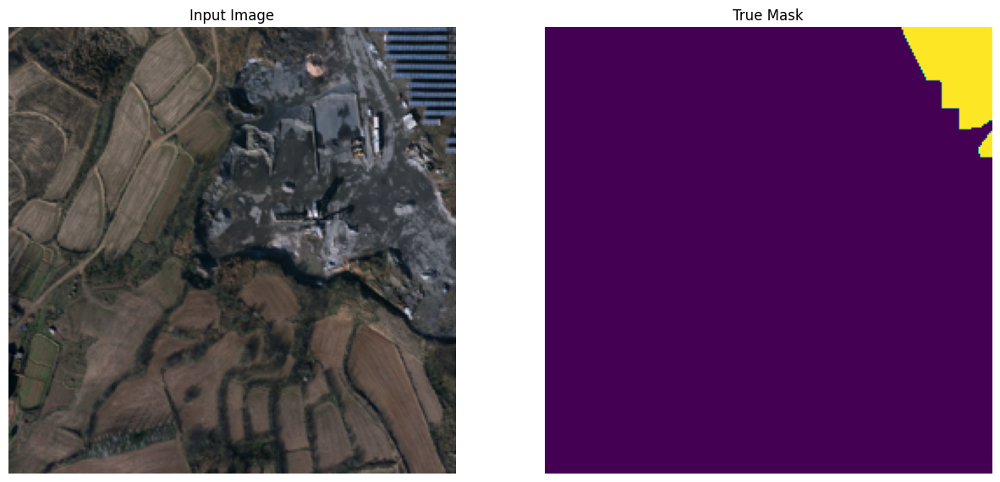

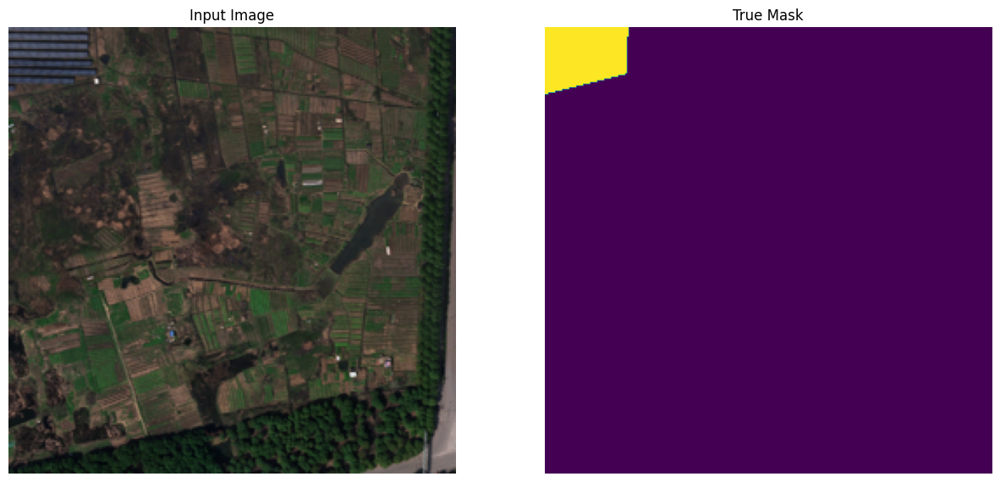

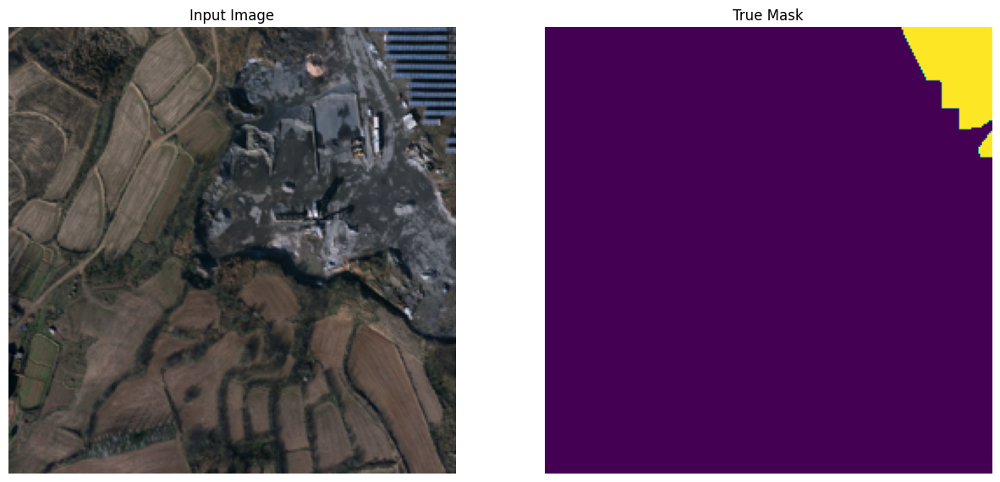

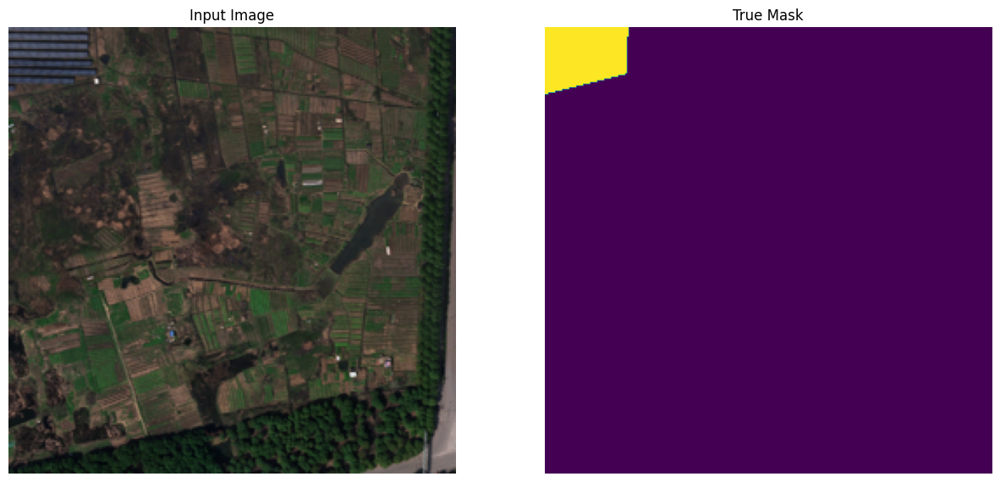

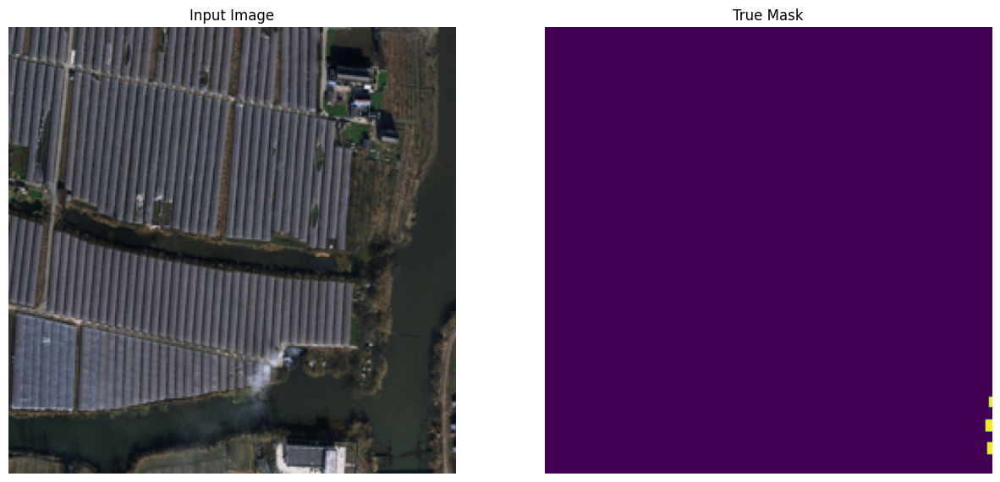

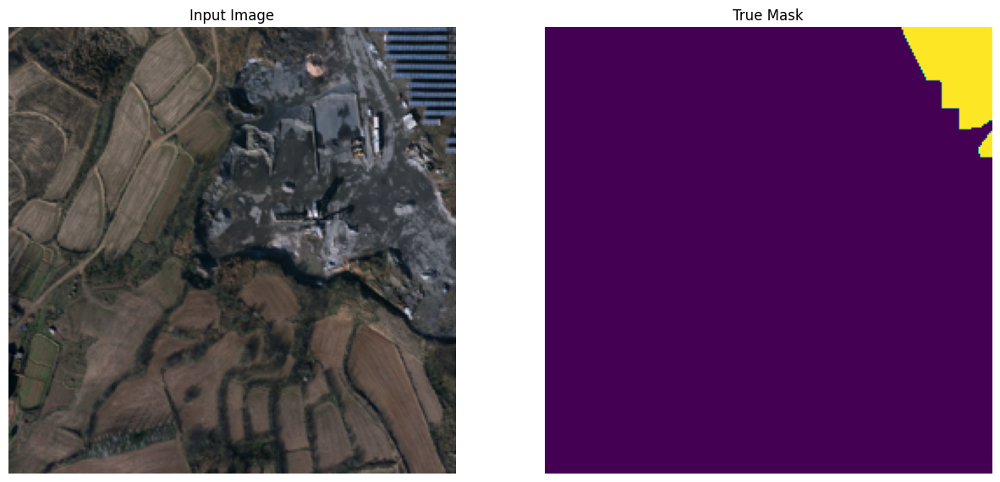

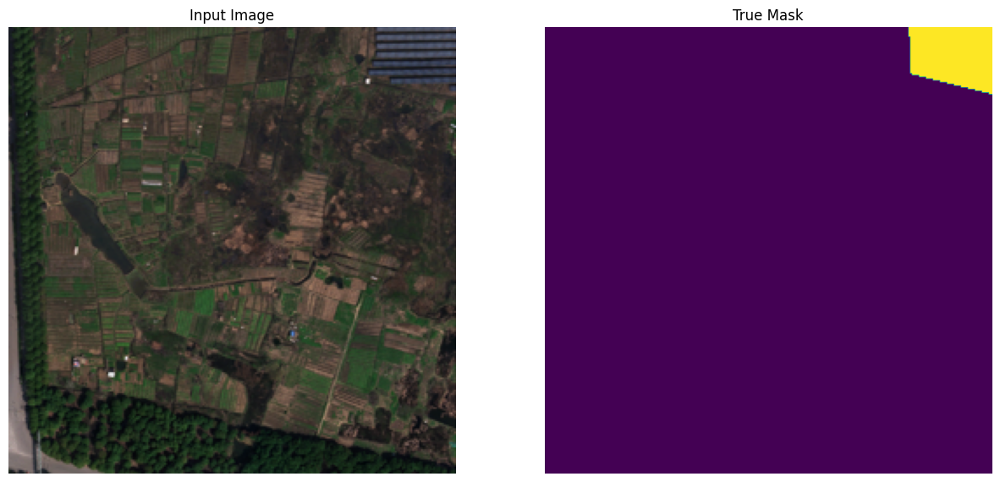

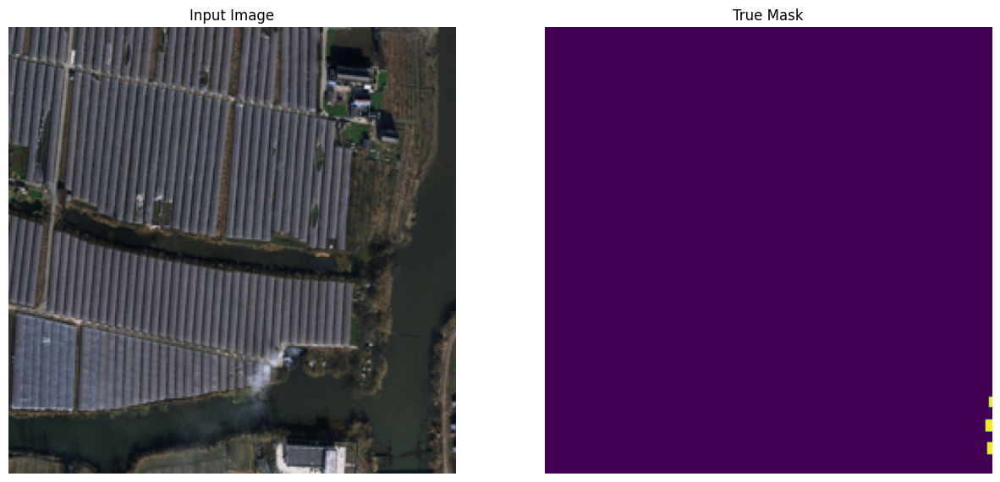

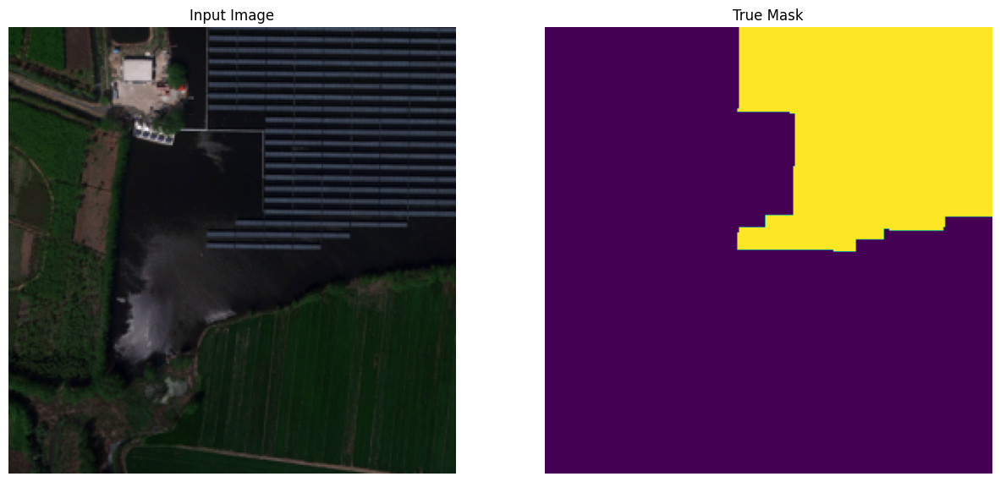

In [69]:
# Let's look the image and it's corresponding mask
for i in range(5):
    for image, mask in train.take(i):
        sample_image, sample_mask = image, mask
        display([sample_image, sample_mask])

# V. Model
---

We are going to use U-Net model. A U-Net consists of an encoder (downsampler) and decoder (upsampler). In-order to learn robust features, and reduce the number of trainable parameters, a pretrained model can be used as the encoder.The encoder will be a pretrained MobileNetV2 model which is prepared and ready to use in tf.keras.applications. 

This script creates a feature extraction model based on MobileNetV2. It extracts features from five specific layers that capture different levels of abstraction. These features can then be used as input to a custom neural network, which can be trained for various tasks such as image segmentation, object detection, or other computer vision applications. By freezing the base model, we ensure that the pre-trained weights are not modified during training, leveraging the learned features from MobileNetV2 effectively.


This script defines a U-Net model for image segmentation. 
The final output is obtained through a transposed convolutional layer, with the number of output channels specified by the output_channels parameter, and uses a sigmoid activation function to produce the segmentation map.

In [70]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)
down_stack.trainable = False

In [71]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

        result.add(tf.keras.layers.ReLU())

    return result

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

In [72]:
def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

  # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2, activation='sigmoid',
      padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# VI. Training the Model
___

Now let's compile the model and see the model architecture

This script defines a U-Net model, compiles it with Dice loss and metrics, and sets up visualization functions to display the input image, true mask, and predicted mask. The Dice coefficient and Dice loss are used to measure and improve the overlap between the true and predicted masks during training. The model is then visualized, and predictions are displayed for a sample image from the training dataset.

In [73]:
pip install pydot 

Note: you may need to restart the kernel to use updated packages.


In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

def dice_loss(in_gt, in_pred):
    return 1-dice_coef(in_gt, in_pred)

model = unet_model(1)

model.compile(optimizer='adam',
              loss = dice_loss,
              metrics=[dice_coef,'binary_accuracy'])

tf.keras.utils.plot_model(model, show_shapes=True)

In [48]:
pip show pydot

Name: pydot
Version: 3.0.1
Summary: Python interface to Graphviz's Dot
Home-page: 
Author: 
Author-email: Ero Carrera <ero.carrera@gmail.com>, Peter Nowee <peter@peternowee.com>, Łukasz <lukaszlapinski7@gmail.com>, "FeRD (Frank Dana)" <ferdnyc@gmail.com>
License: 
Location: /home/jovyan/my-conda-envs/py310/lib/python3.10/site-packages
Requires: pyparsing
Required-by: 
Note: you may need to restart the kernel to use updated packages.


Let's try out the model to see what it predicts before training.

2024-07-18 13:34:57.757875: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


1/1 [==============================] - 1s 743ms/step


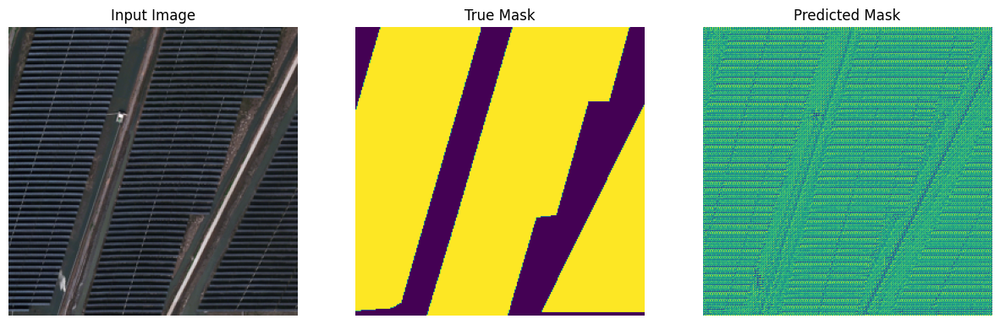

In [76]:
for images, masks in train_dataset.take(1):
    for img, mask in zip(images, masks):
        sample_image = img
        sample_mask = mask
        break
def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])
    
show_predictions(sample_image, sample_mask)

In [77]:
model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_8 (Functional)           [(None, 128, 128, 9  1841984     ['input_11[0][0]']               
                                6),                                                               
                                 (None, 64, 64, 144                                               
                                ),                                                                
                                 (None, 32, 32, 192                                        

Display Callback: Displays predictions every 5 epochs to monitor model performance visually.
Training Configuration: Trains the model for 30 epochs, with a specified number of steps per epoch, using training and validation datasets, and includes the defined callbacks.

Epoch 1/30
72/72 [==============================] - 136s 2s/step - loss: 0.3376 - dice_coef: 0.6624 - binary_accuracy: 0.8538 - val_loss: 0.1848 - val_dice_coef: 0.8208 - val_binary_accuracy: 0.9450
Epoch 2/30
72/72 [==============================] - 131s 2s/step - loss: 0.1940 - dice_coef: 0.8032 - binary_accuracy: 0.9526 - val_loss: 0.1745 - val_dice_coef: 0.8306 - val_binary_accuracy: 0.9489
Epoch 3/30
72/72 [==============================] - 132s 2s/step - loss: 0.1718 - dice_coef: 0.8294 - binary_accuracy: 0.9568 - val_loss: 0.1617 - val_dice_coef: 0.8431 - val_binary_accuracy: 0.9557
Epoch 4/30
1/1 [==============================] - 0s 62ms/step


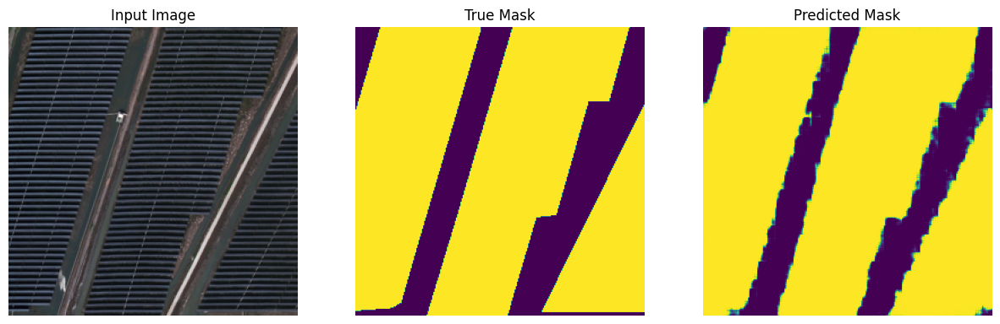

Epoch 5/30
72/72 [==============================] - 130s 2s/step - loss: 0.1624 - dice_coef: 0.8356 - binary_accuracy: 0.9575 - val_loss: 0.1550 - val_dice_coef: 0.8495 - val_binary_accuracy: 0.9582
Epoch 6/30
72/72 [==============================] - 131s 2s/step - loss: 0.1554 - dice_coef: 0.8410 - binary_accuracy: 0.9577 - val_loss: 0.1495 - val_dice_coef: 0.8549 - val_binary_accuracy: 0.9594
Epoch 7/30
72/72 [==============================] - 129s 2s/step - loss: 0.1524 - dice_coef: 0.8451 - binary_accuracy: 0.9606 - val_loss: 0.1519 - val_dice_coef: 0.8525 - val_binary_accuracy: 0.9584
Epoch 8/30
72/72 [==============================] - 124s 2s/step - loss: 0.1558 - dice_coef: 0.8432 - binary_accuracy: 0.9565 - val_loss: 0.1690 - val_dice_coef: 0.8361 - val_binary_accuracy: 0.9548
Epoch 9/30
1/1 [==============================] - 0s 58ms/step


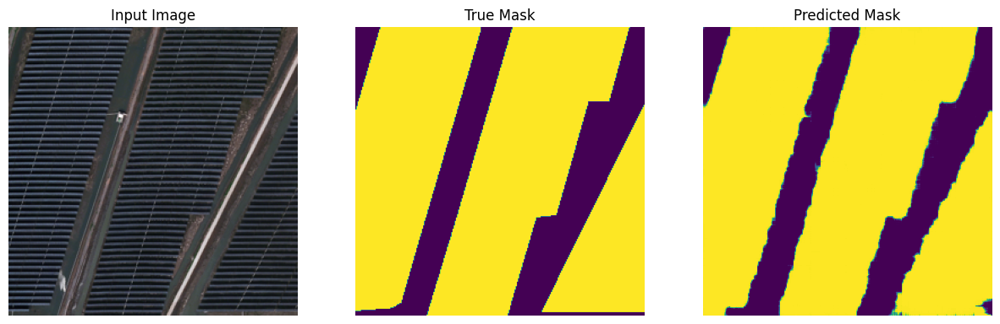

Epoch 10/30
72/72 [==============================] - 125s 2s/step - loss: 0.1430 - dice_coef: 0.8570 - binary_accuracy: 0.9601 - val_loss: 0.1618 - val_dice_coef: 0.8430 - val_binary_accuracy: 0.9563


In [78]:
early_stop = tf.keras.callbacks.EarlyStopping(patience=4,restore_best_weights=True)

# Let's observe how the model improves while it is training. 
# To accomplish this task, a callback function is defined below.
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_predictions(sample_image, sample_mask)
EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_data=valid_dataset,
                          callbacks=[DisplayCallback(), early_stop])

# VI. Inferance
---

1/1 [==============================] - 0s 54ms/step


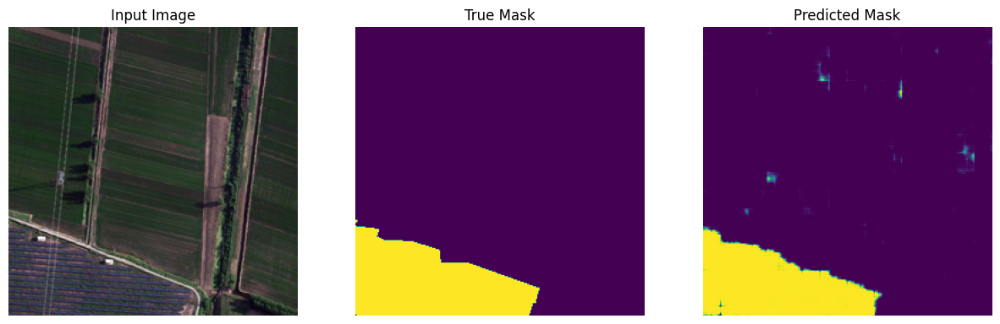

1/1 [==============================] - 0s 53ms/step


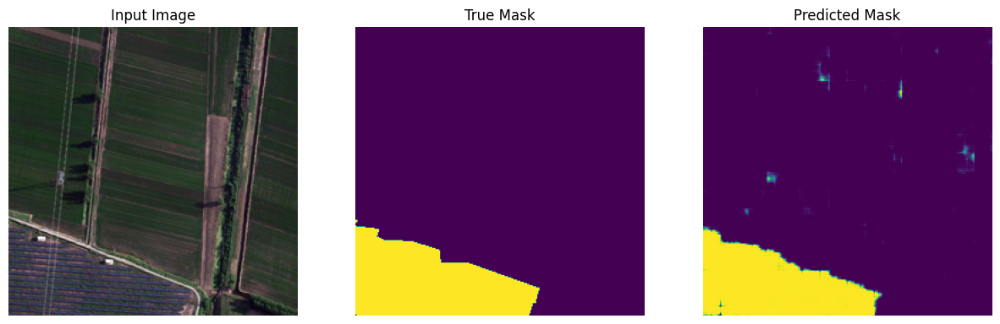

1/1 [==============================] - 0s 61ms/step


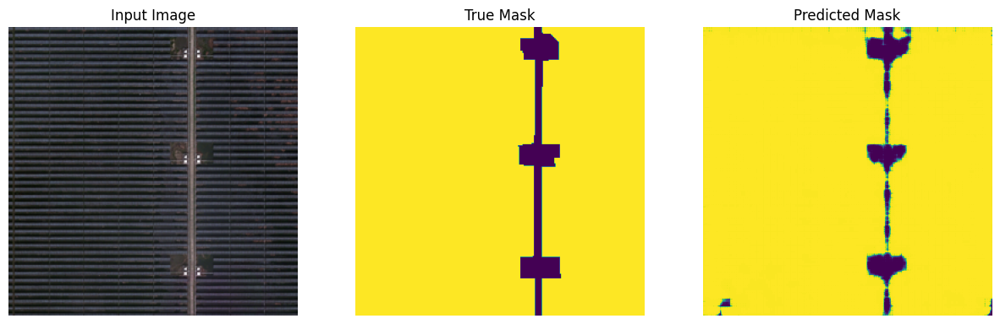

1/1 [==============================] - 0s 75ms/step


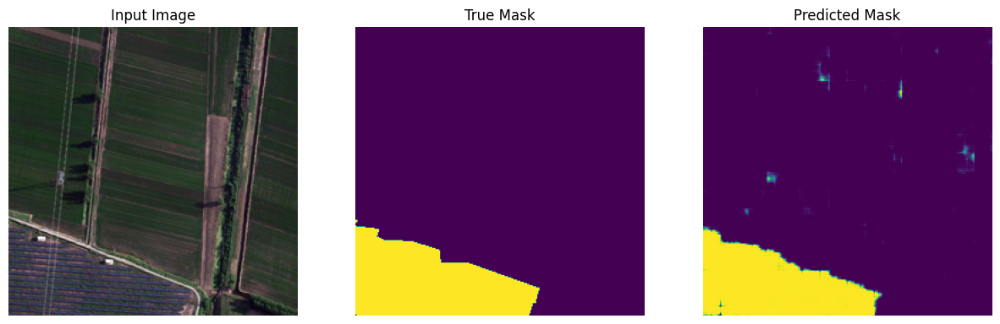

1/1 [==============================] - 0s 67ms/step


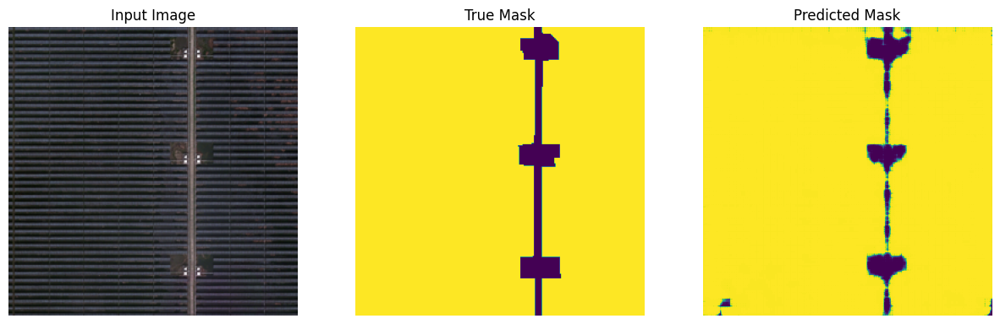

1/1 [==============================] - 0s 57ms/step


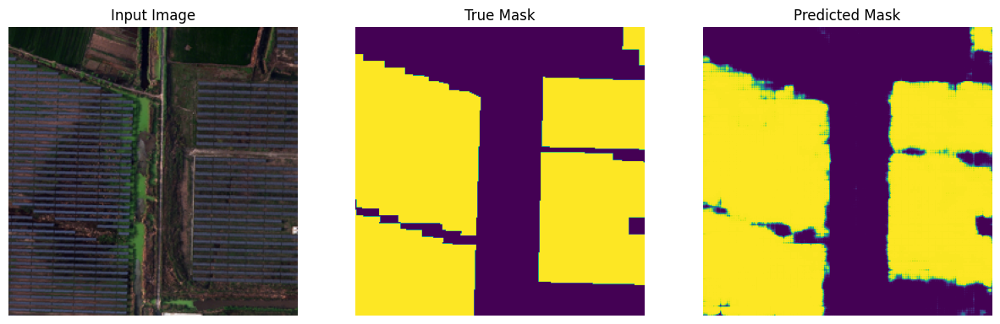

1/1 [==============================] - 0s 64ms/step


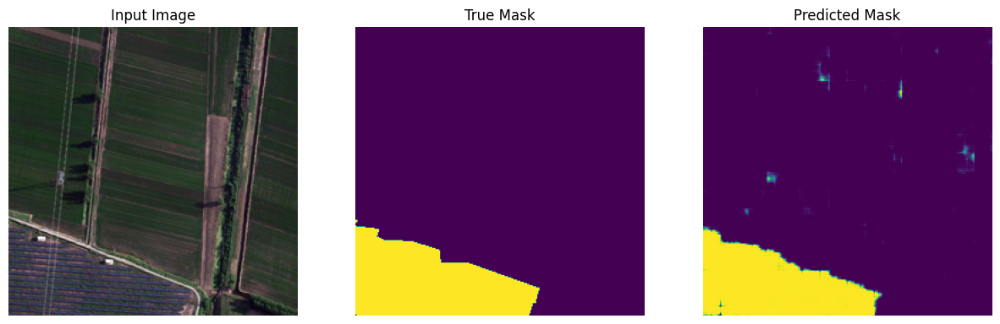

1/1 [==============================] - 0s 53ms/step


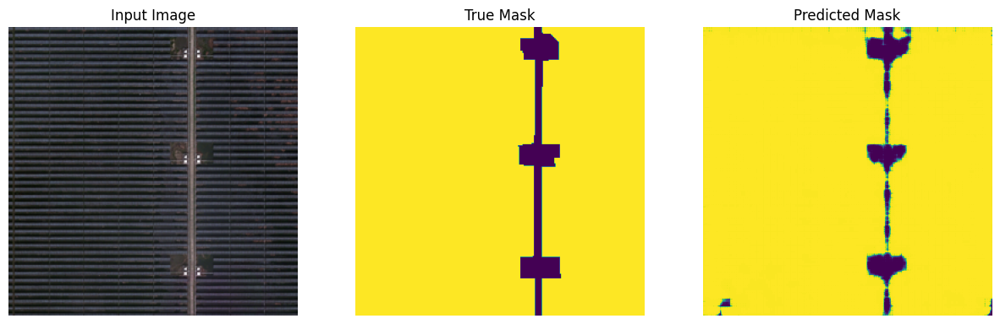

1/1 [==============================] - 0s 54ms/step


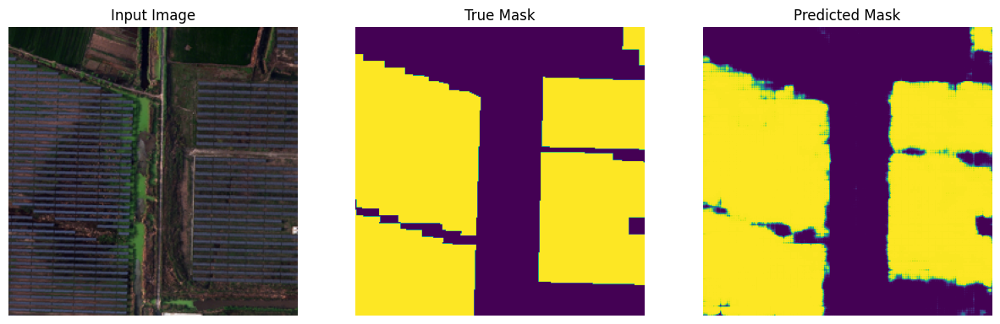

1/1 [==============================] - 0s 61ms/step


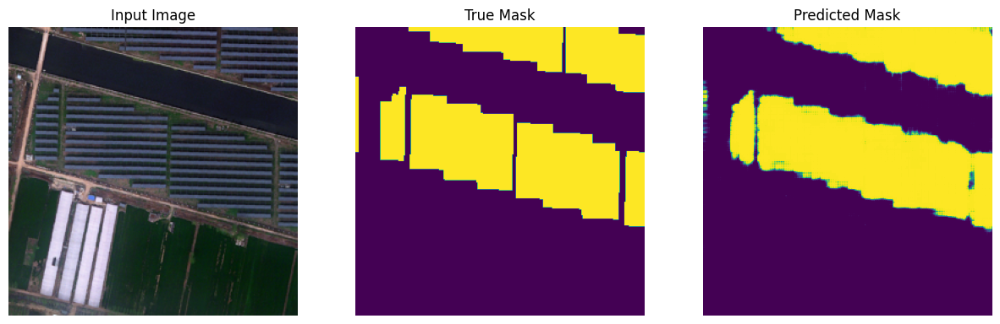

In [79]:
for i in range(5):
    for image, mask in valid.take(i):
        sample_image, sample_mask = image, mask
        show_predictions(sample_image, sample_mask)

# VI. Save and Load the Model 
---

This script allows you to see how well the model predicts the mask for a sample image by visualizing the input and predicted output.

- Visualization Function: visualize_predicted is defined to show the input image and predicted mask side by side.- 
Prediction and Display: show_ predicts the mask for the given image and calls the visualization functi.
- Image Preprocessing: The sample image is loaded, resized, and converted to a NumPy array before being passed to the prediction function.
ion.

In [80]:
model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [81]:
def visualize_predicted(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_(sample_image):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize_predicted([sample_image, pred_mask])
    return pred_mask

1/1 [==============================] - 2s 2s/step


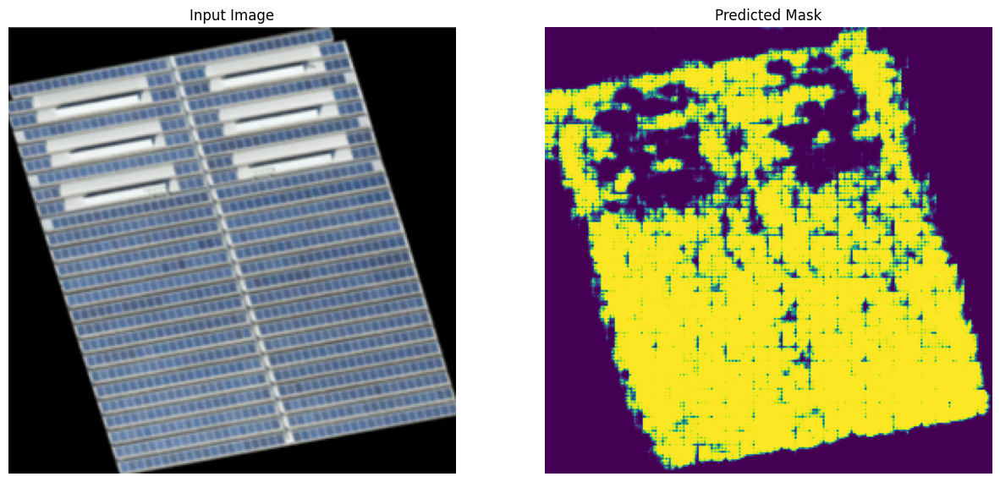

In [82]:
sample_image = Image.open('/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/kaggle_solar/PV03/input/2024-07-12 165425.png')
sample_image = sample_image.resize((256,256))
np_sample_image = np.array(sample_image.convert("RGB"))
pred_mask = show_(np_sample_image)

1/1 [==============================] - 0s 54ms/step


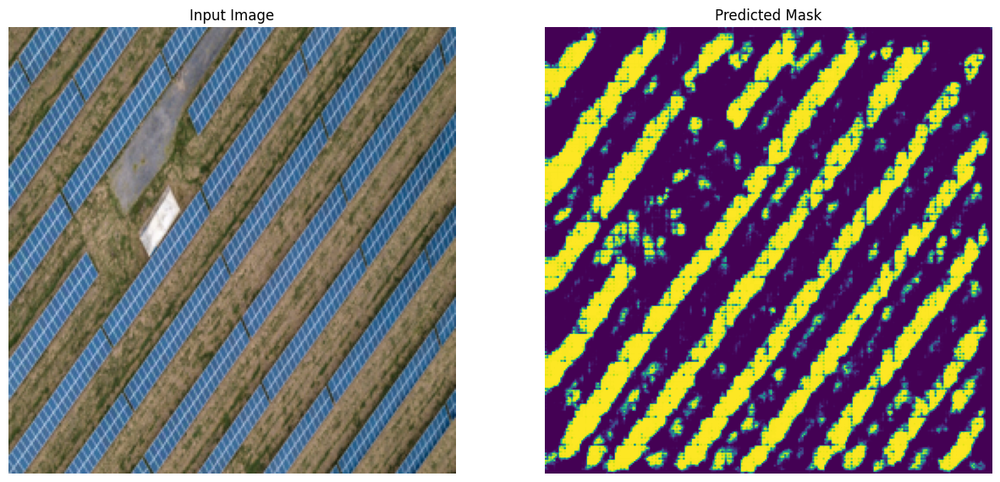

In [86]:
sample_image = Image.open('/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/kaggle_solar/PV03/input/GS_solar1-e1633083521660-1024x573.jpg')
sample_image = sample_image.resize((256,256))
np_sample_image = np.array(sample_image.convert("RGB"))
pred_mask = show_(np_sample_image)

1/1 [==============================] - 0s 57ms/step


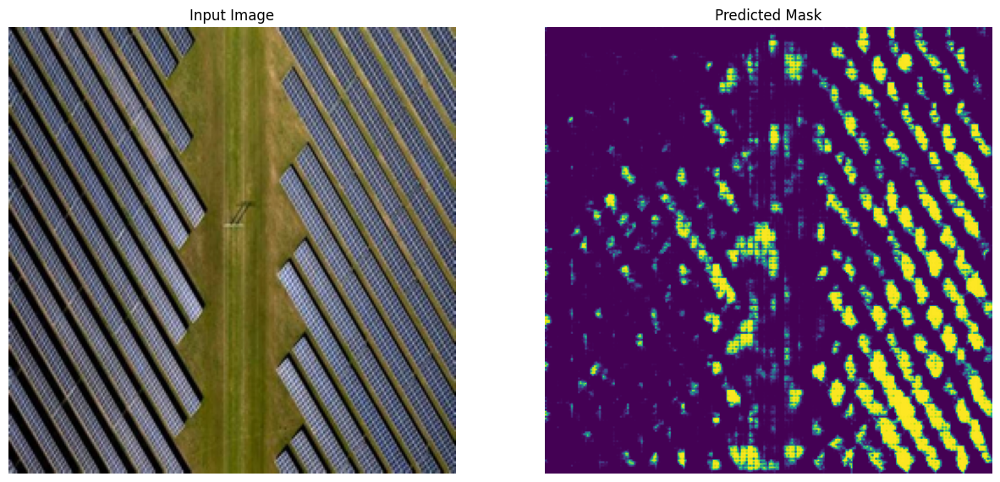

In [87]:
sample_image = Image.open('/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/kaggle_solar/PV03/input/OIP.jpg')
sample_image = sample_image.resize((256,256))
np_sample_image = np.array(sample_image.convert("RGB"))
pred_mask = show_(np_sample_image)

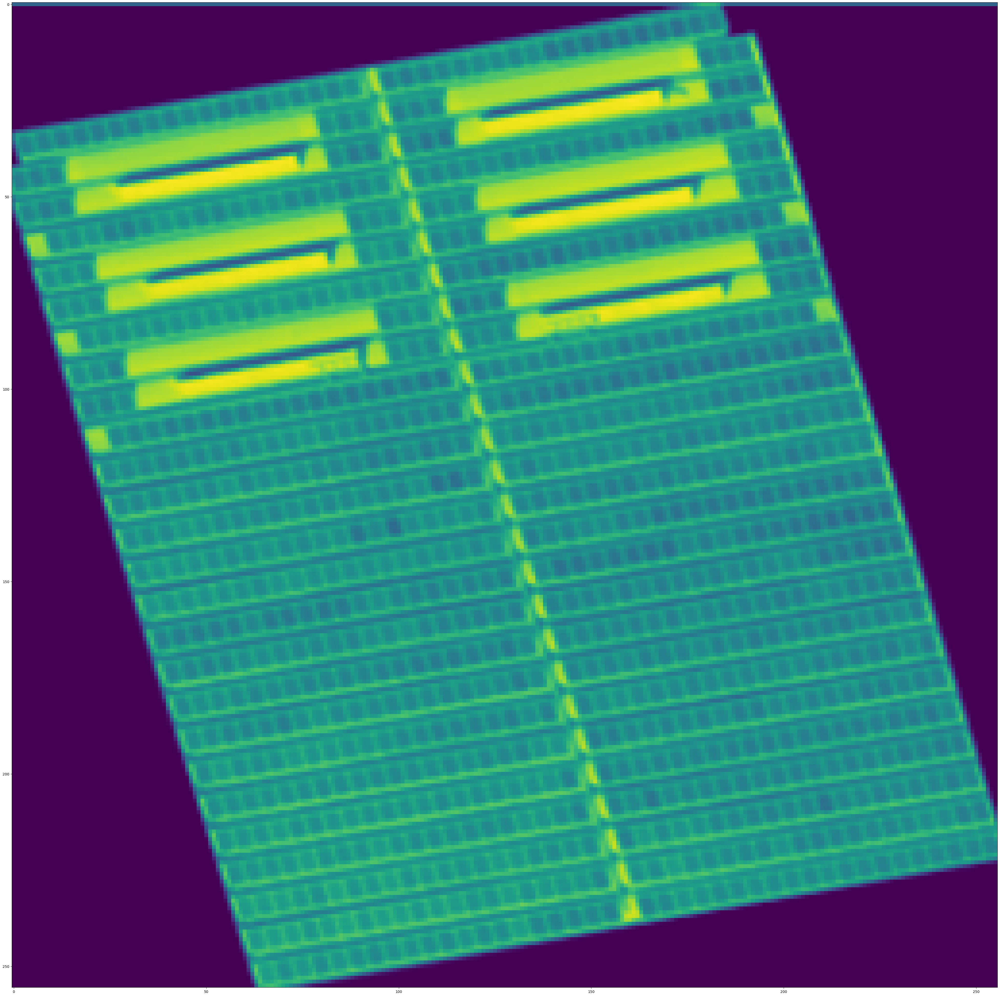

In [40]:
import cv2
gray = cv2.cvtColor(np_sample_image, cv2.COLOR_BGR2GRAY)
fig,ax = plt.subplots(1)
fig.set_size_inches(50, 50)
ax.imshow(gray)